<a href="https://colab.research.google.com/github/Farhana-Tani/training-and-testing-yolo26-instance-segmentation/blob/main/Testing_Yolo26_Instance_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Testing Yolo26 Instance Segmentation

## Dataset path

https://universe.roboflow.com/university-bswxt/crack-bphdr

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.1/46.1 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 34.1 MB/s eta 0:00:00


In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
import os
import cv2

In [ ]:
from ultralytics import YOLO

In [ ]:
model = YOLO("/content/weights/best.pt")

In [ ]:
model = YOLO("/content/weights/last.pt")

## Inference on image


image 1/1 /content/train_batch0.jpg: 640x640 9 cracks, 19.9ms
Speed: 4.9ms preprocess, 19.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


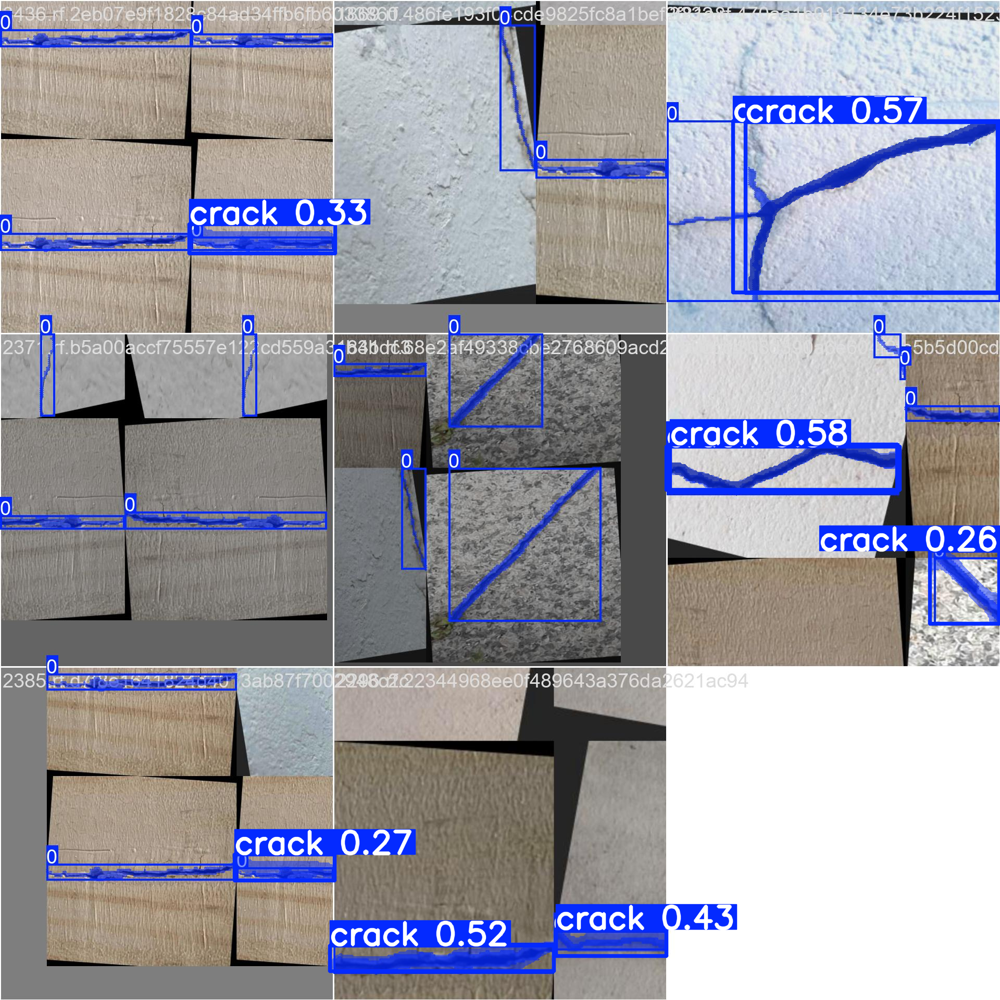

In [ ]:
file_name ="/content/train_batch0.jpg"
results = model(file_name)  # predict on an image

# Process results list
for result in results:
    result.show()  # display to screen
    file_name, ext = os.path.splitext(file_name)
    result.save(filename=f"{file_name}_output.jpg")  # save to disk

## Inference on Batch of Images


0: 640x640 11 cracks, 9.4ms
1: 640x640 9 cracks, 9.4ms
Speed: 3.1ms preprocess, 9.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
0


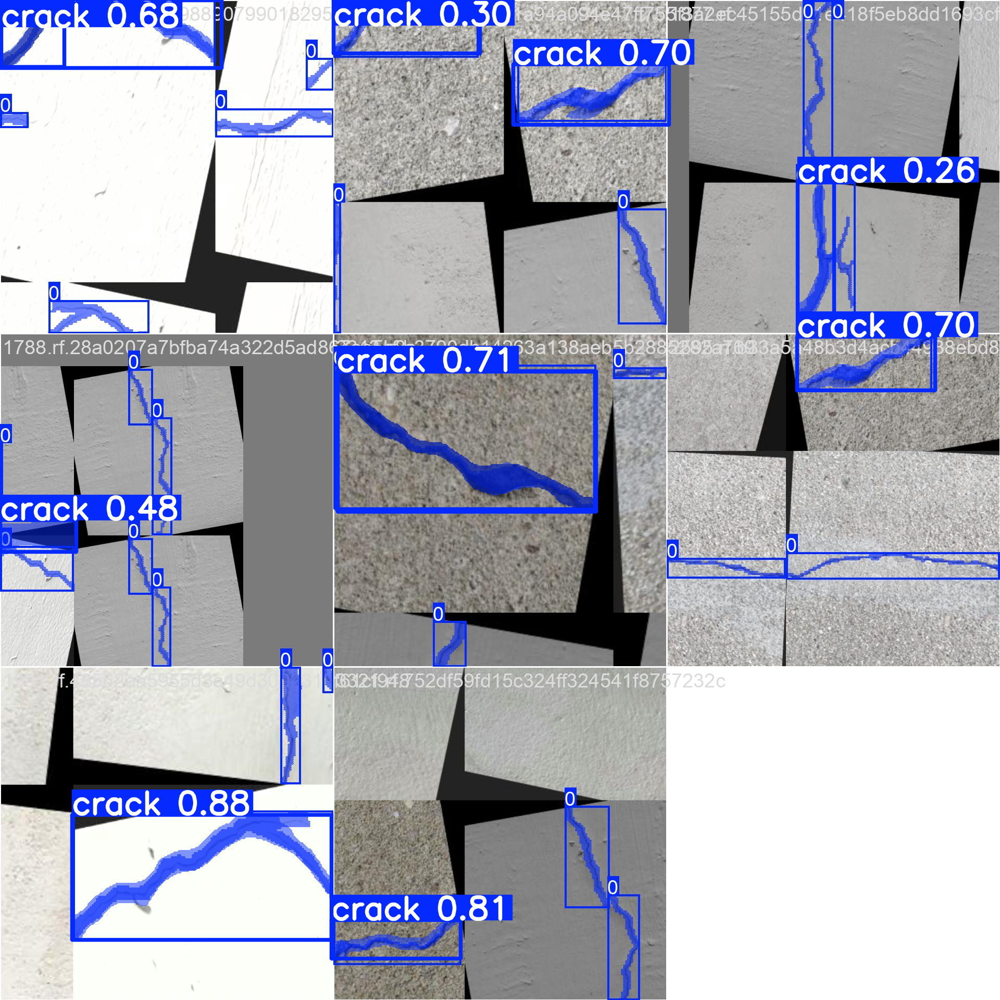

1


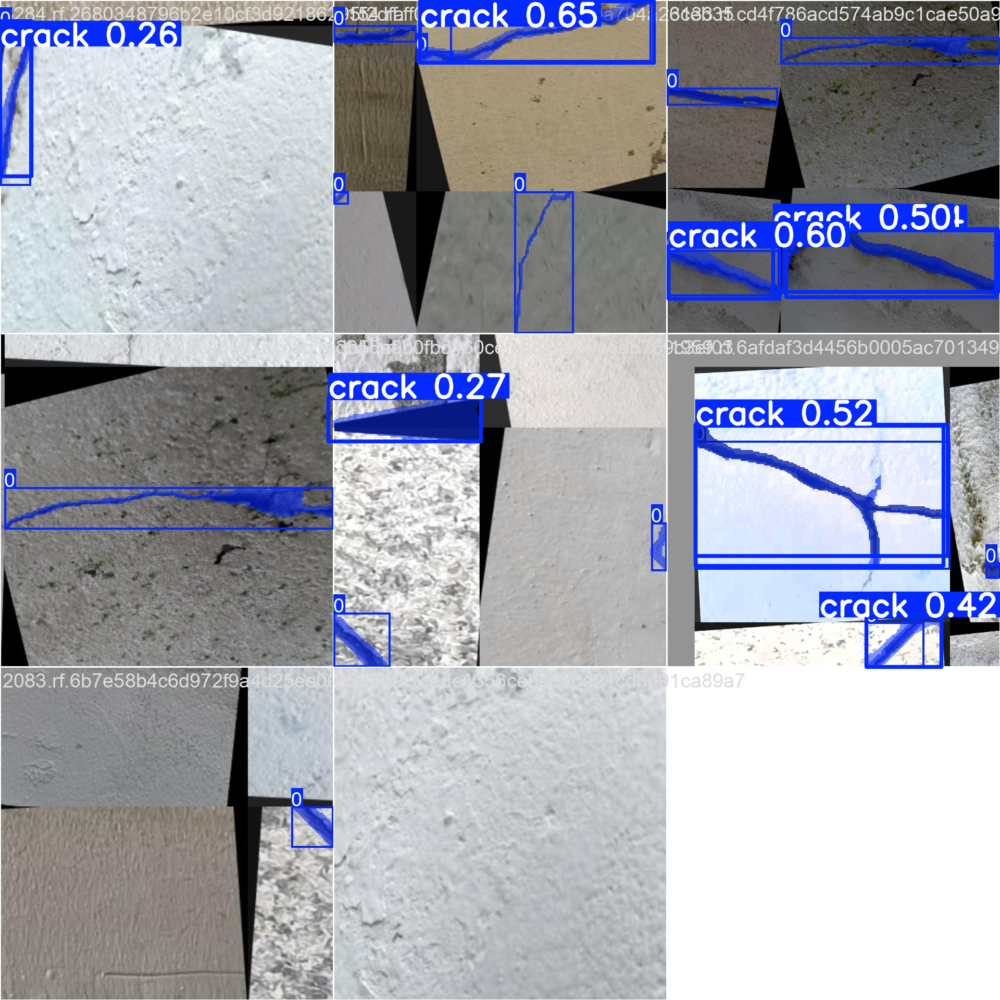

In [ ]:
file_name_1 = "/content/train_batch1.jpg"
file_name_2 = "/content/train_batch2.jpg"
batch = [file_name_1, file_name_2]
# Run batched inference on a list of images
results = model(batch)  # predict on an image

# Process results list
for idx, result in enumerate(results):
    print(idx)
    result.show()  # display to screen
    file_name, ext = os.path.splitext(batch[idx])
    result.save(filename=f"{file_name}_output_{idx}.jpg")  # save to disk

## Inference on np.ndarray

In [ ]:
import cv2

In [ ]:
file_name = "/content/train_batch0.jpg"
image_array = cv2.imread(file_name)
print(type(image_array))

<class 'numpy.ndarray'>



0: 640x640 9 cracks, 16.2ms
Speed: 4.2ms preprocess, 16.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


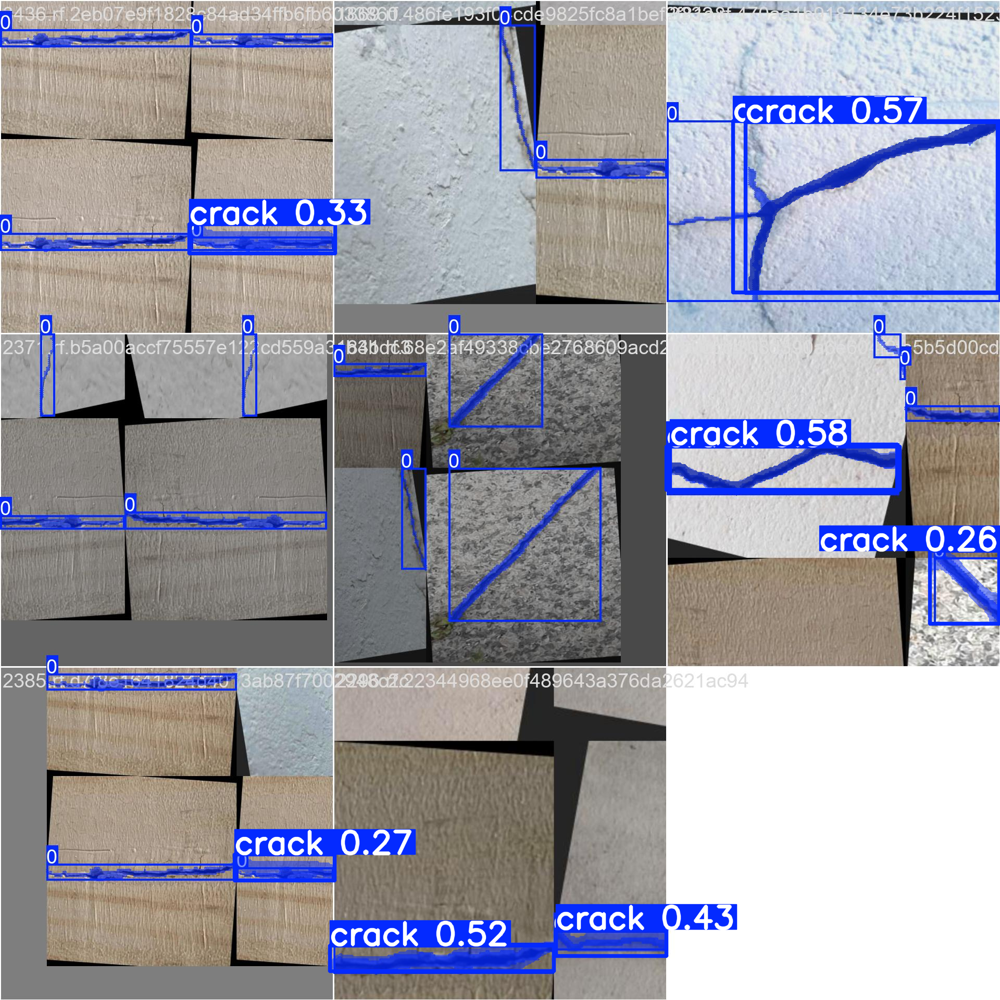

In [ ]:
results = model(image_array)  # predict on an ndarray

# Process results list
for result in results:
    result.show()  # display to screen
    file_name, ext = os.path.splitext(file_name)
    result.save(filename=f"{file_name}_output.jpg")  # save to disk

## Extract Masks like semantic segmentation

In [ ]:
import torch

In [ ]:
import matplotlib.pyplot as plt


0: 640x640 9 cracks, 13.2ms
Speed: 5.1ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


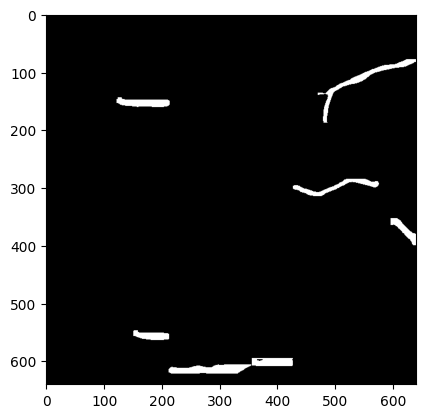

In [ ]:
results = model(image_array)  # predict on an ndarray

# Process results list
for result in results:
    if result.masks:
      # get array results
      masks = result.masks.data
      boxes = result.boxes.data

      # extract classes
      # [x, y, x, y , cls]
      clss = boxes[:, 5]

      # get indices of results where class is 0 (crack in custom dataset)
      object_indices = torch.where(clss == 0)

      # use these indices to extract the relevant masks
      crack_masks = masks[object_indices]

      if len(crack_masks) == 0:
        print("No mask found")

      # scale for visualizing results
      mask = torch.any(crack_masks, dim=0).to(torch.uint8) * 255
      mask = mask.cpu().numpy()
      plt.imshow(mask, cmap='grey')